In [28]:
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

In [10]:
file = '../Data/WA_Fn-UseC_-HR-Employee-Attrition.csv'

df=pd.read_csv(file)
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


# Introductory Data Analysis

Looking at the overview of the data, we can see that we have <font color='aqua'>35 </font> columns available in this dataset. 
We will pass the pandas profiling render the exploratory data analysis on each columns and give us a better overview:

In [11]:
profile = ProfileReport(df, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

We can see in the overview section that we have <font color='aqua'> 1470 </font> observations with no missing data. The profiling has also given us the break down of the feature types in the dataset with <font color='aqua'> 15 </font> numeric features, <font color='aqua'> 3 </font>  boolean features and <font color='aqua'> 17 </font> categorical features

In the above report, we can drill down to the individual features and understand its distribution and breakdown in more detail that you can look through at your own time.

# Exploratory Data Analysis

As the above reports represents the data profiling of all the features independently, in this section we will explore how our target variable (Attrition) behaves against other features in the dataset.

## Exploring Attrition against Boolean values: Overtime, Over18
In our dataset, we have three boolean values, Attrition, Overtime and Over18. As Attrition is our target variable, we will look at whether Overtime has effect on attrition. Over18 will be excluded from the analysis as it is only confirming that all of our observations are over 18 years of age at time of employment, which all the observations results to True.

<AxesSubplot: xlabel='Attrition', ylabel='count'>

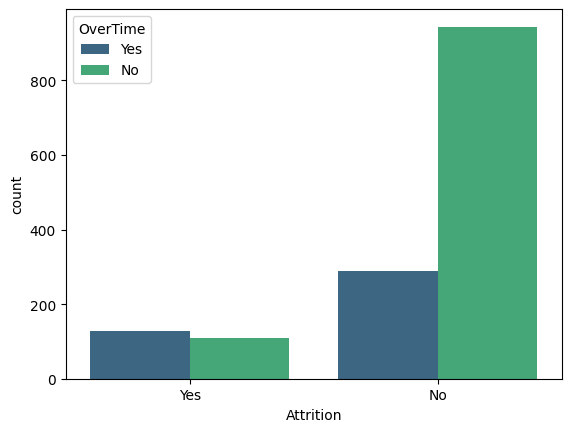

In [29]:
sns.countplot(data=df,x='Attrition',hue='OverTime',palette='viridis')

Looking at the above graph, we can see that those who left did do OverTime during their time, but also there are many who are in the firm.
Let us look at the gender distribution for those who left vs those who are still in the firm.

<AxesSubplot: xlabel='Attrition', ylabel='count'>

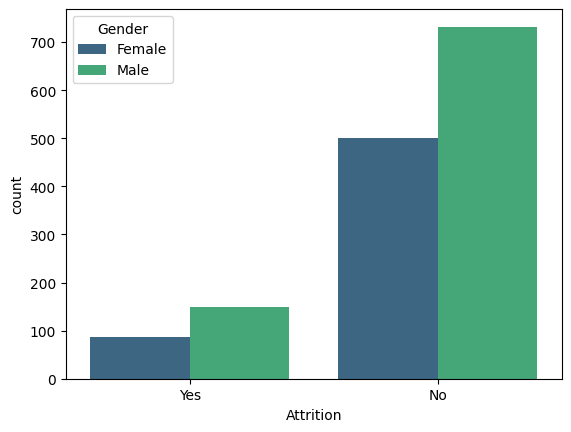

In [30]:
sns.countplot(data=df,x='Attrition',hue='Gender',palette='viridis')

We observe that of those who left the company, most of them where male rather than female. Let us dive deeper into other categories and look at the attrition by departments:

<AxesSubplot: xlabel='Attrition', ylabel='count'>

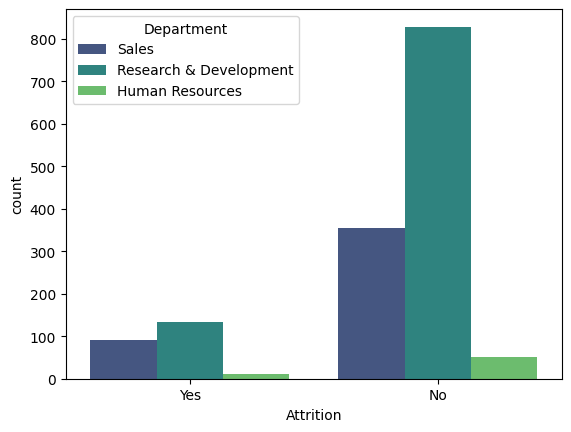

In [31]:
sns.countplot(data=df,x='Attrition',hue='Department',palette='viridis')

We can see that for those who left the company, the highest department has been the Research & Development, while attrition is at it lowest from the Human Resources department. Let us perform a correlation analysis to examine relationships between the different datapoints, however, before we do that, we will look at converting categorical data into numerical values using get_dummies function.

In [44]:
#Lets drop the unwanted columns
df.drop(['Over18','EmployeeNumber','EmployeeCount'],axis=1, inplace=True)

In [45]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StandardHours', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'Non-Travel', 'Travel_Frequently', 'Travel_Rarely', 'Human Resources',
       'Research & Development', 'Sales'],
      dtype='object')

In [47]:
#df['Attrition'] = df['Attrition'].map(dict(Yes=1, No=0))
#df['Gender'] = df['Gender'].map(dict(Female=1, Male=0))
#df=df.join(pd.get_dummies(df['BusinessTravel'],dtype=int))
#df=df.join(pd.get_dummies(df['Department'],dtype=int))
#df=df.join(pd.get_dummies(df['EducationField'],dtype=int))
df=df.join(pd.get_dummies(df['JobRole'],dtype=int))
df

ValueError: columns overlap but no suffix specified: Index(['Human Resources'], dtype='object')

In [48]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Non-Travel,Travel_Frequently,Travel_Rarely,Human Resources,Research & Development,Sales
0,41,NaN,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,NaN,...,6,4,0,5,0,0,1,0,0,1
1,49,NaN,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,NaN,...,10,7,1,7,0,1,0,0,1,0
2,37,NaN,Travel_Rarely,1373,Research & Development,2,2,Other,4,NaN,...,0,0,0,0,0,0,1,0,1,0
3,33,NaN,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,NaN,...,8,7,3,0,0,1,0,0,1,0
4,27,NaN,Travel_Rarely,591,Research & Development,2,1,Medical,1,NaN,...,2,2,2,2,0,0,1,0,1,0
